In [1]:
from pathlib import Path
import rasterio
import matplotlib.pyplot as plt
import matplotlib as mpl
from skimage.transform import rescale
import os
import sys
import zipfile

repo_path = str(Path().resolve().parent)
os.chdir(repo_path)
sys.path.append(repo_path)

from src.satellite_image_processing.image_handler.general_image_handler import (
    BouctoucheImageHandler,
    CocagneImageHandler,
    WestImageHandler,
    MorellImageHandler,
    DunkImageHandler
)

In [2]:
bouctouche_zip_path = "data/sentinel2_data/bouctouche/S2A_MSIL2A_20220607T151701_N0400_R025_T20TLS_20220607T215910.zip"
cocagne_zip_path = "data/sentinel2_data/cocagne/S2A_MSIL2A_20220607T151701_N0400_R025_T20TLS_20220607T215910.zip"
west_zip_path = "data/sentinel2_data/west/S2A_MSIL2A_20220607T151701_N0400_R025_T20TMS_20220607T215910.zip"
dunk_zip_path = "data/sentinel2_data/dunk/S2A_MSIL2A_20220607T151701_N0400_R025_T20TMS_20220607T215910.zip"
morell_zip_path = "data/sentinel2_data/morell/S2A_MSIL2A_20220607T151701_N0400_R025_T20TNS_20220607T215910.zip"

In [3]:
class_color = ["black", "red", "lightgrey", "brown", "green", "yellow", "blue", "black", "gray", "white", "lightblue", "pink"]
cmap = mpl.colors.ListedColormap(class_color)

In [4]:
bouctouche_image_handler = BouctoucheImageHandler(bouctouche_zip_path)
cocagne_image_handler = CocagneImageHandler(cocagne_zip_path)
west_image_handler = WestImageHandler(west_zip_path)
dunk_image_handler = DunkImageHandler(dunk_zip_path)
morell_image_handler = MorellImageHandler(morell_zip_path)

In [5]:
def print_shape_and_display_images(image_handler):
    print(f"water mask shape: {image_handler.water_mask.shape}")
    print(f"tci shape: {image_handler.true_color_image.shape}")
    fig, axs = plt.subplots(1, 3, figsize=(10, 10))
    axs[0].imshow(image_handler.true_color_image)
    axs[1].imshow(image_handler.water_mask, cmap="Reds", alpha=0.4, interpolation="nearest")
    axs[2].imshow(image_handler.get_smoothed_water_mask(), cmap="Reds", alpha=0.4, interpolation="nearest")
    plt.show()
    fig = plt.figure(figsize=(12, 12))
    plt.imshow(image_handler.true_color_image)
    plt.imshow(image_handler.water_mask, cmap="Reds", alpha=0.4, interpolation="nearest")
    plt.show()
    fig = plt.figure(figsize=(12, 12))
    plt.imshow(image_handler.true_color_image)
    plt.imshow(image_handler.get_smoothed_water_mask(), cmap="Reds", alpha=0.4, interpolation="nearest")
    plt.show()

water mask shape: (1170, 2006)
tci shape: (1170, 2006, 3)


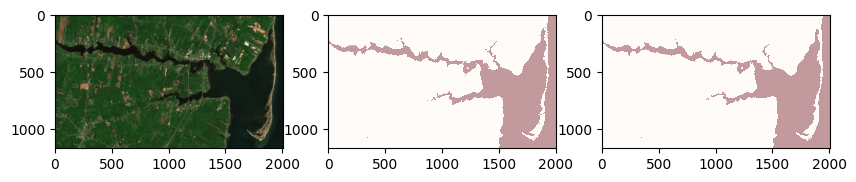

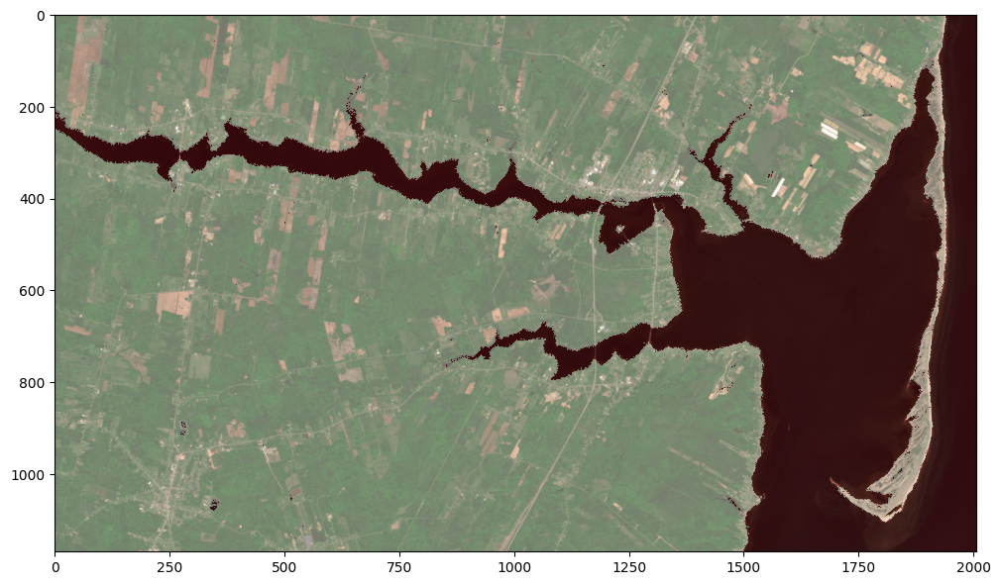

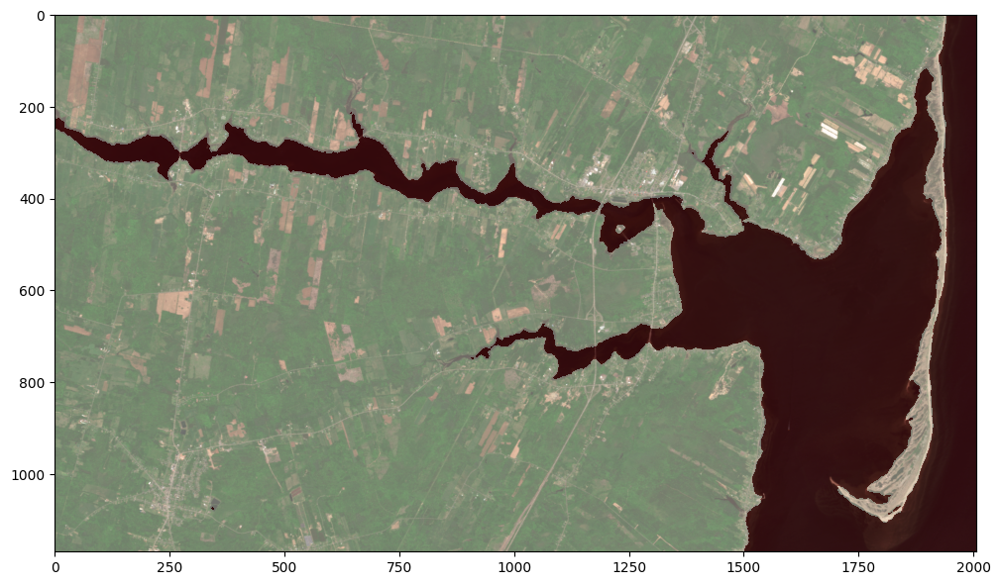

In [6]:
print_shape_and_display_images(bouctouche_image_handler)

water mask shape: (1122, 1373)
tci shape: (1122, 1373, 3)


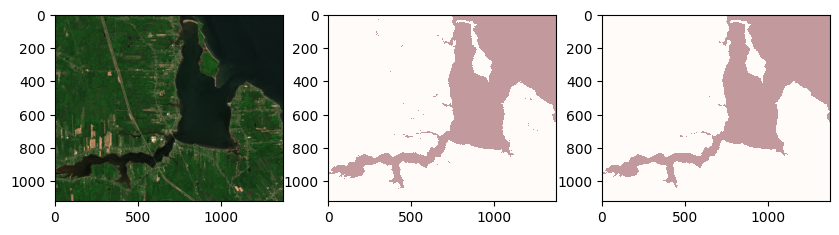

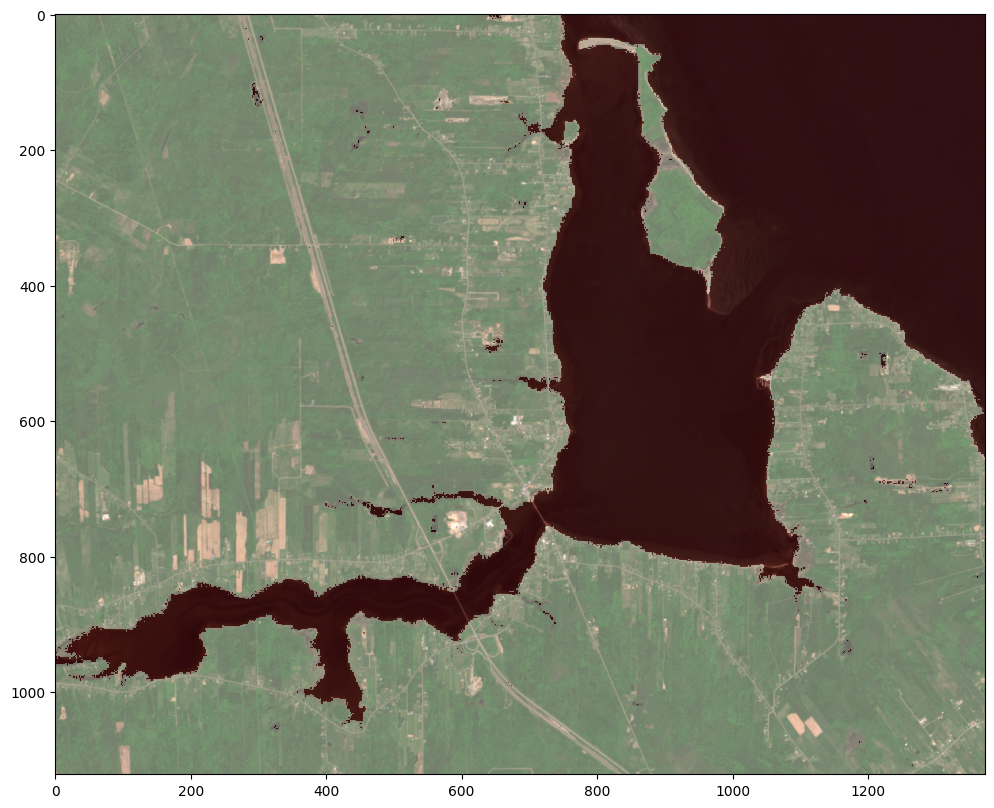

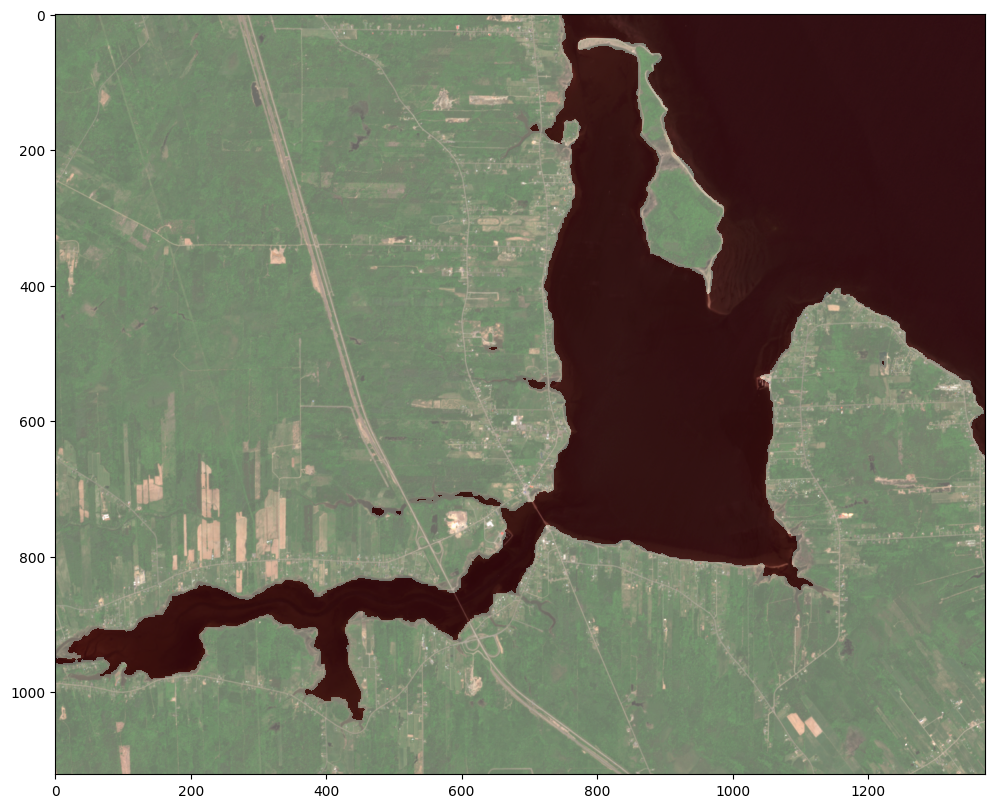

In [7]:
print_shape_and_display_images(cocagne_image_handler)

water mask shape: (869, 1912)
tci shape: (869, 1912, 3)


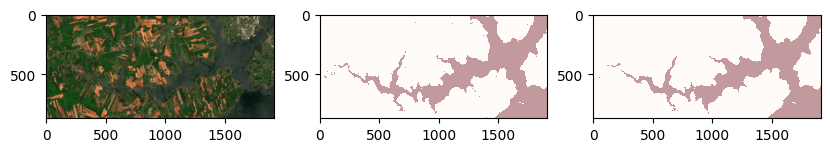

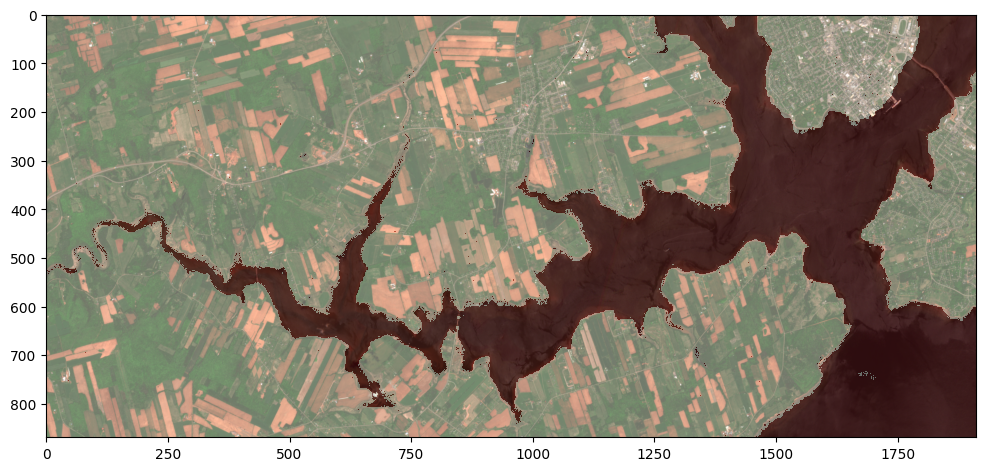

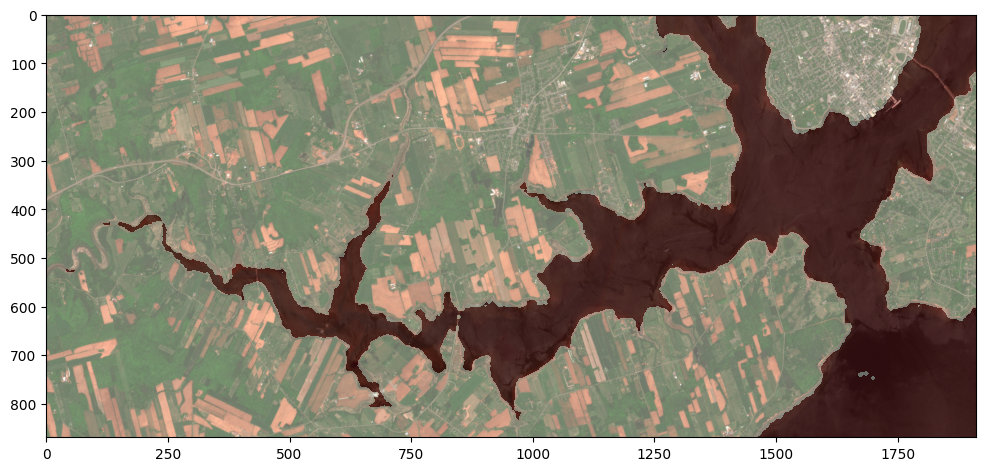

In [8]:
print_shape_and_display_images(west_image_handler)

water mask shape: (1121, 829)
tci shape: (1121, 829, 3)


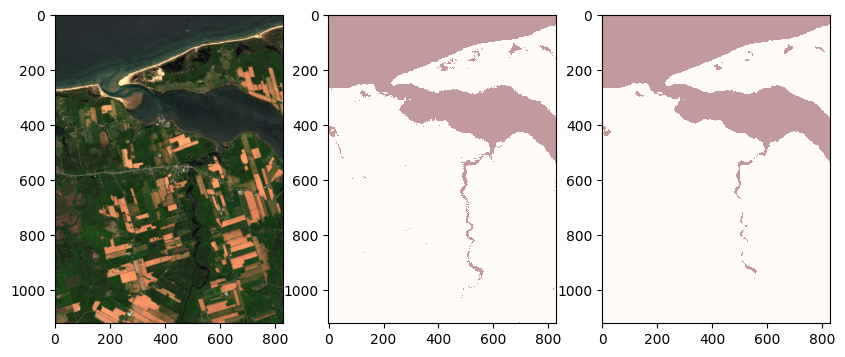

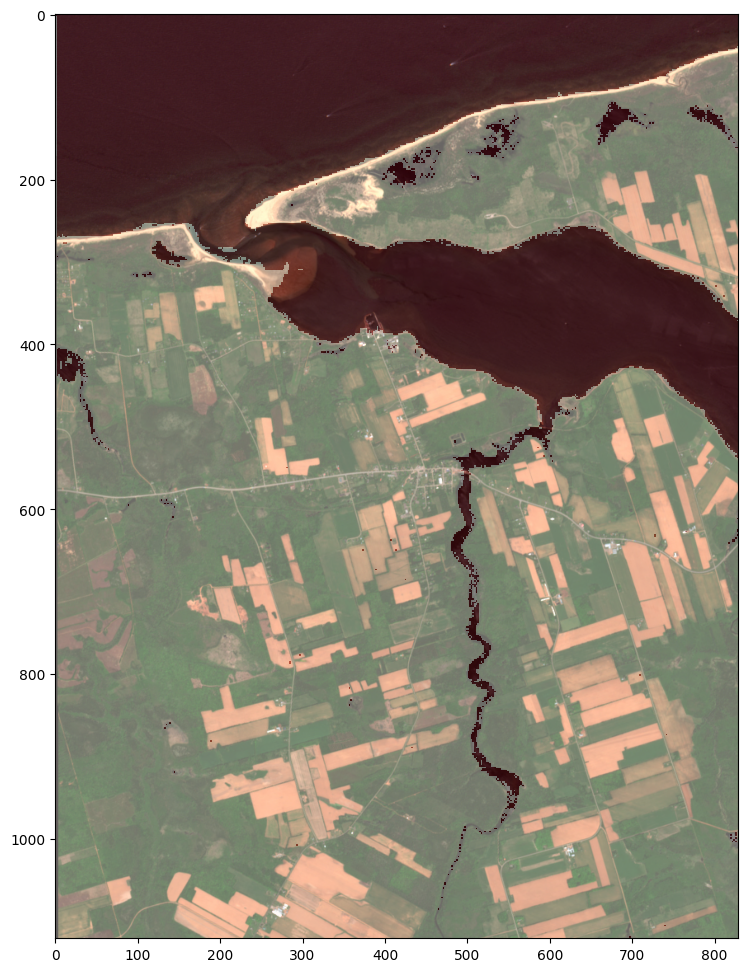

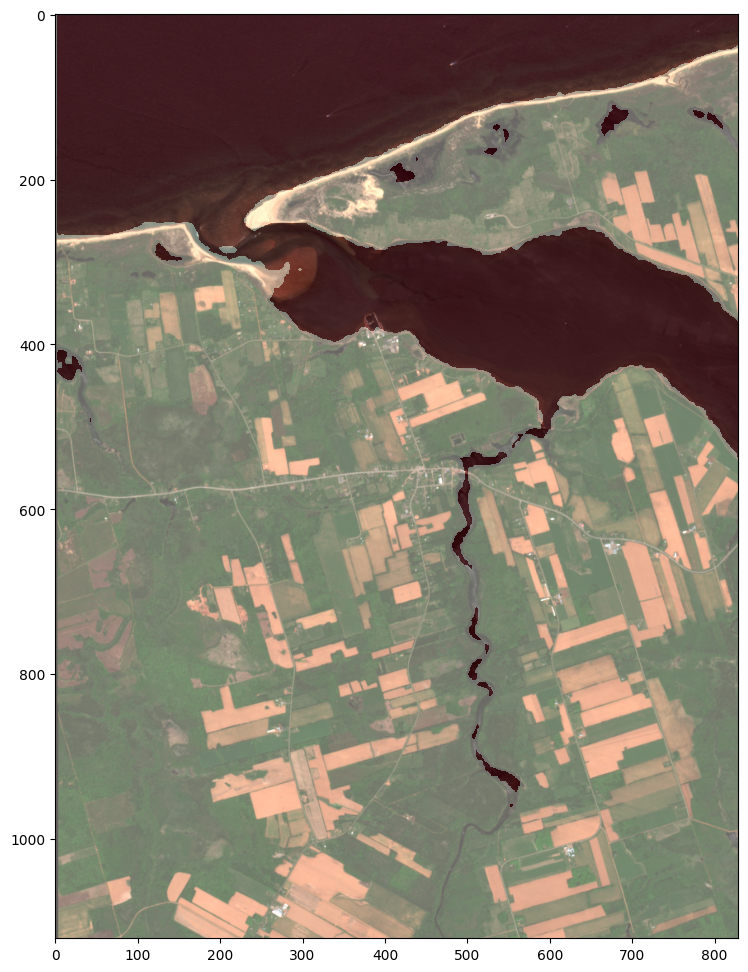

In [9]:
print_shape_and_display_images(morell_image_handler)

water mask shape: (666, 1278)
tci shape: (666, 1278, 3)


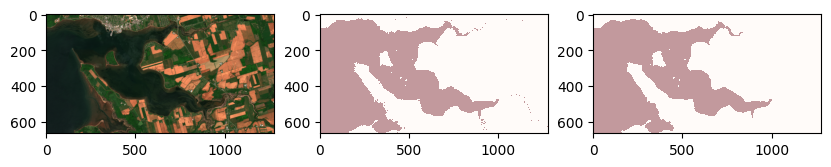

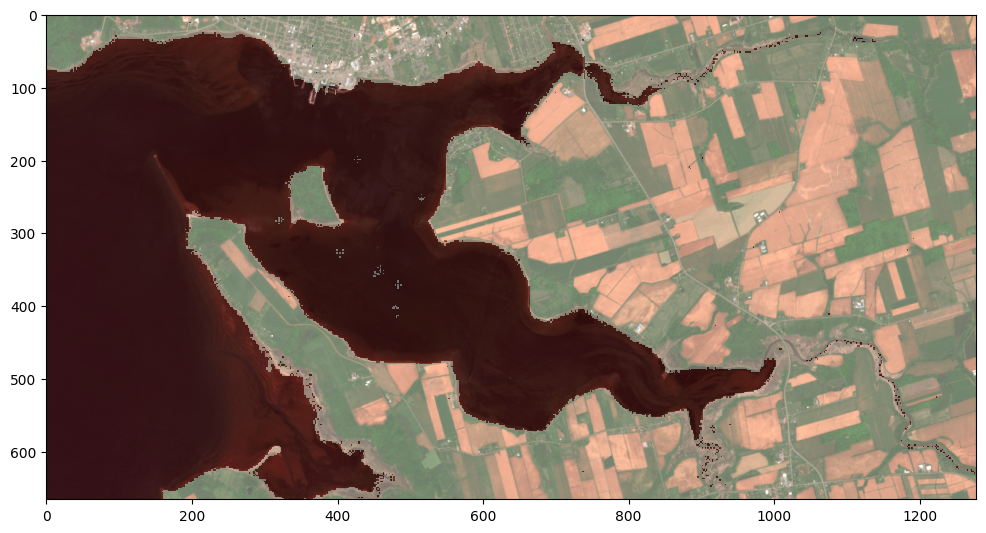

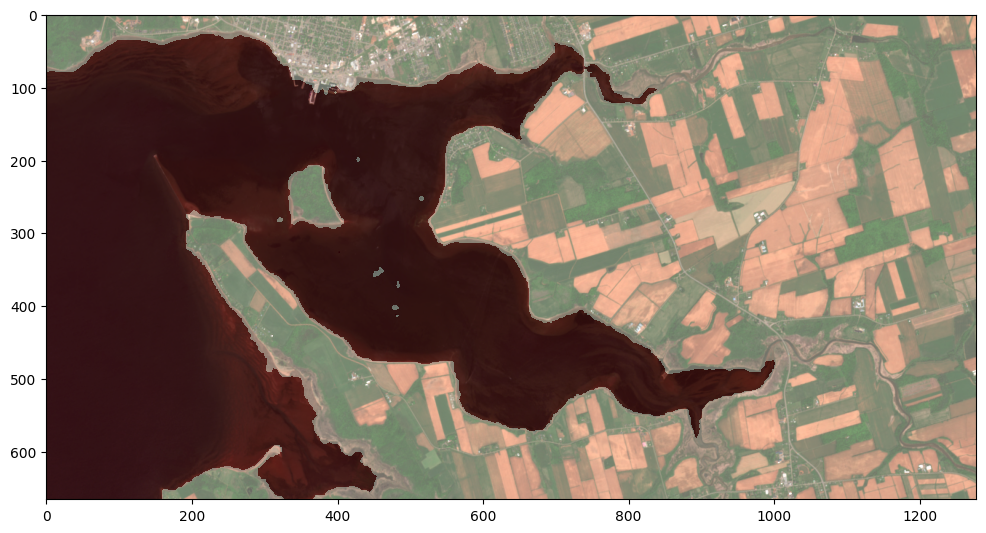

In [10]:
print_shape_and_display_images(dunk_image_handler)

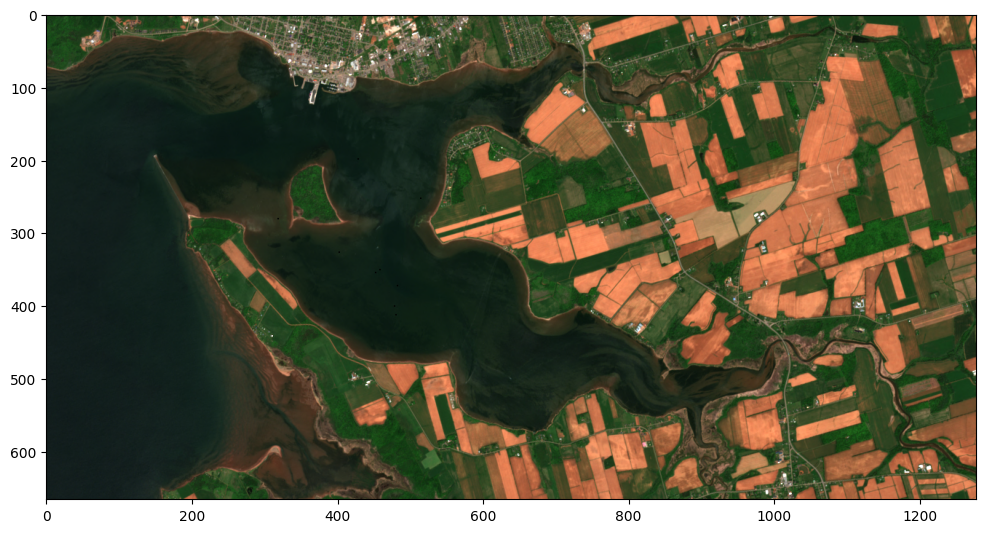

In [12]:
fig = plt.figure(figsize=(12, 12))
plt.imshow(dunk_image_handler.true_color_image)

array([[1278., 1288., 1267., ..., 1700., 1915., 1796.],
       [1281., 1275., 1210., ..., 1774., 1921., 1817.],
       [1274., 1263., 1238., ..., 1858., 1899., 1805.],
       ...,
       [1299., 1321., 1317., ..., 1660., 1674., 1767.],
       [1279., 1288., 1318., ..., 1687., 1785., 1784.],
       [1284., 1275., 1316., ..., 1766., 1821., 1841.]])

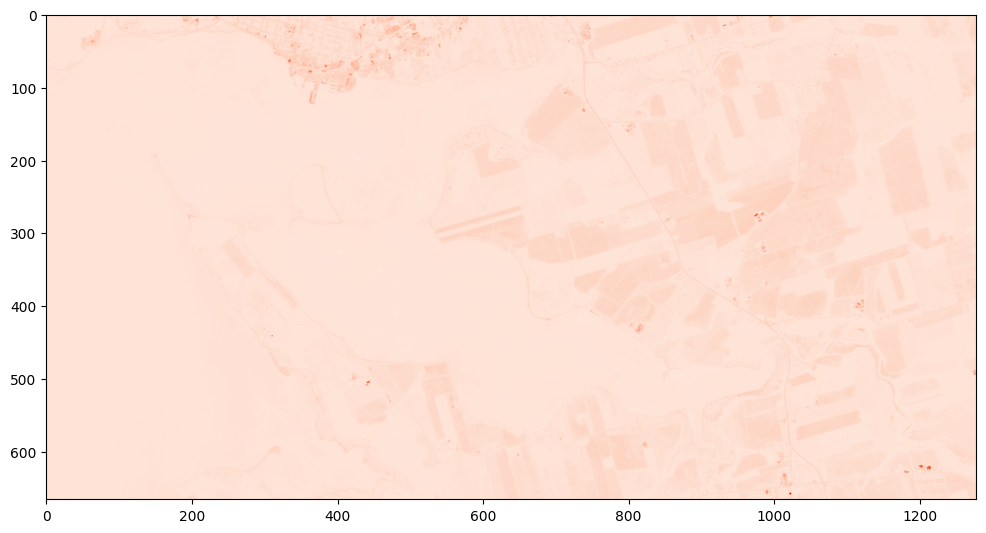

In [26]:
fig = plt.figure(figsize=(12, 12))
plt.imshow(dunk_image_handler.blue_band.astype(float), cmap="Reds")

In [56]:
(((bouctouche_image_handler.get_smoothed_water_mask() * bouctouche_image_handler.nir_band).astype(float)/1000) > 0.1).mean()

0.21210130292882037

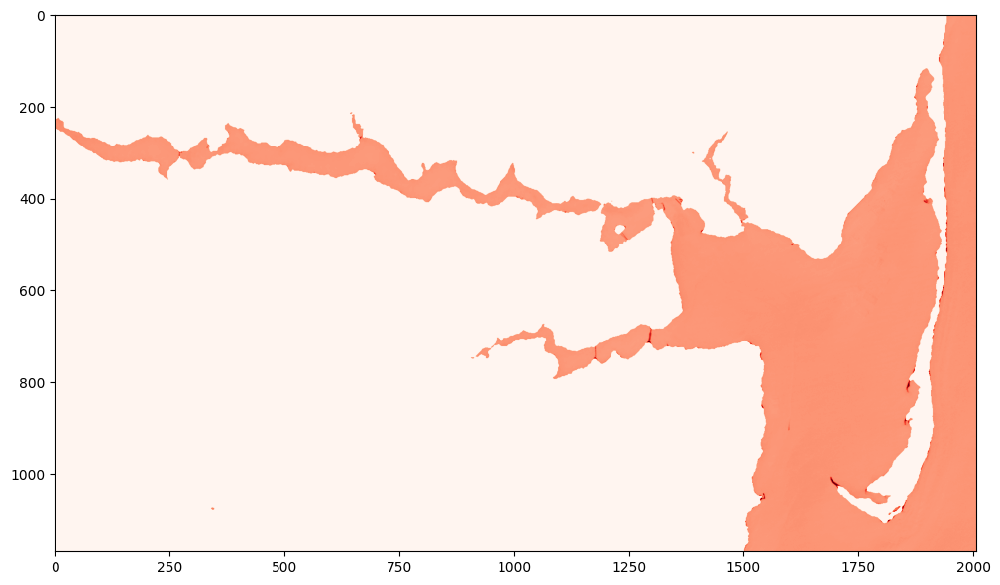

In [57]:
fig = plt.figure(figsize=(12, 12))
plt.imshow(numpy.clip((bouctouche_image_handler.get_smoothed_water_mask() * bouctouche_image_handler.nir_band).astype(float)/10000, 0, 1), cmap="Reds", vmin=0, vmax=0.3)

In [75]:
pandas.Series((bouctouche_image_handler.get_smoothed_water_mask() * bouctouche_image_handler.nir_band).astype(float).flatten()/100).describe()

count    2.347020e+06
mean     2.339657e+00
std      4.525734e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      4.325000e+01
dtype: float64

In [81]:
(((bouctouche_image_handler.get_smoothed_water_mask() * bouctouche_image_handler.nir_band).astype(float).flatten()/100) < 0.9).mean()

0.7878986970711797